# Temporal Changes in Collision Data: Implications for Mobility Plan 2035


### Introduction

LA drivers have attained global notoriety for their bad driving, and one only needs to be on the road for five minutes to recognize that there is an ounce of truth to this image. HLA notes that Vermont Avenue has seen more pedestrian deaths than the entire state of Vermont. 

The Mobility Plan 2035, which as of 2019 has joined the nationwide Vision Zero movement, attempts to ameliorate conditions that have historically contributed to the abnormally high collision frequency in LA. The document outlines a variety of measures to increase street safety, either from the agent side through traffic safety education or the infrastructure side through the addition of protected bike lanes and other improvements to the built environment.

Though many of the components of LA's mobility plan hold promising benefits, implementation, just like 405S at 9 AM, has moved at a snail's pace. Only ~5% of the improved networks for pedestrians, bikes, and cars have been built since the plan was first adopted by LA City Council in 2015. Safer Streets estimates that at the current rate, changes will be completed in 160 years.



In the meantime, traffic collisions have increased at alarming rates. The council's deadline looms ahead. By 2025, LA County hopes to reduce the number of traffic-related fatalities to zero. Instead, deaths continue to rise. Consequently, a couple of research questions emerge from the inadequacy of LA county in dealing with these changes.
1. How has the spatial distribution of collisions changed over time? What's driven the recent increase in collisions since Vision Zero was adopted in LA? How does this fit in with the narrative of car-centrism in LA and the declining use of public transportation? Are the high-injury road segments prioritized in 2019 still relevant today?
2. How has the cause of collisions changed over time?
3. Amid these changes, how do we ensure that no county is left behind?
4. How effective has regional coordination been?
5. How does the uneven concentration of different political groups (e.g. firefighter unions vs environmentalists) affect the quality of local infrastructure?

### Final Potential Research Question
**What's driven the recent increase in traffic collisions in LA County and what does that mean for the efficacy of plans to increase mobility? How will different road management practices variegate the impacts of HLA's benefits? Is there a need for standardization? Should commuter-heavy districts prioritize road maintenace of arterial streets more than localized neighborhoods? How do we ensure that the policies intended to reduce collisions are salient for specific areas given the variance in spatial distribution of causes behind collisions?**

### Roadmap
I. Exploratory Data Analysis
    1. Collisions
    2. Infrastructure
II.


In [1]:
# import libraries
import pandas as pd
import geopandas as gpd
import folium
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
import contextily as ctx
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import csv

#unused packages below 
#from sodapy import Socrata
#import requests

### Collision Data 2020 for LA County
Source: [Berkeley TIMS](https://tims.berkeley.edu/)

In [2]:
#loading crash data file from Berkeley TIMS

df_coll20 = pd.read_csv('Data/Crashes2020_TIMS.csv',quoting=csv.QUOTE_NONE,on_bad_lines='skip')

/tmp/ipykernel_162/1113878829.py:3: DtypeWarning: Columns (14) have mixed types. Specify dtype option on import or set low_memory=False.
  df_coll20 = pd.read_csv('Data/Crashes2020_TIMS.csv',quoting=csv.QUOTE_NONE,on_bad_lines='skip')


In [3]:
#checking included information

df_coll20.columns

Index(['CASE_ID', 'ACCIDENT_YEAR', 'PROC_DATE', 'JURIS', 'COLLISION_DATE',
       'COLLISION_TIME', 'OFFICER_ID', 'REPORTING_DISTRICT', 'DAY_OF_WEEK',
       'CHP_SHIFT', 'POPULATION', 'CNTY_CITY_LOC', 'SPECIAL_COND', 'BEAT_TYPE',
       'CHP_BEAT_TYPE', 'CITY_DIVISION_LAPD', 'CHP_BEAT_CLASS', 'BEAT_NUMBER',
       'PRIMARY_RD', 'SECONDARY_RD', 'DISTANCE', 'DIRECTION', 'INTERSECTION',
       'WEATHER_1', 'WEATHER_2', 'STATE_HWY_IND', 'CALTRANS_COUNTY',
       'CALTRANS_DISTRICT', 'STATE_ROUTE', 'ROUTE_SUFFIX', 'POSTMILE_PREFIX',
       'POSTMILE', 'LOCATION_TYPE', 'RAMP_INTERSECTION', 'SIDE_OF_HWY',
       'TOW_AWAY', 'COLLISION_SEVERITY', 'NUMBER_KILLED', 'NUMBER_INJURED',
       'PARTY_COUNT', 'PRIMARY_COLL_FACTOR', 'PCF_CODE_OF_VIOL',
       'PCF_VIOL_CATEGORY', 'PCF_VIOLATION', 'PCF_VIOL_SUBSECTION',
       'HIT_AND_RUN', 'TYPE_OF_COLLISION', 'MVIW', 'PED_ACTION',
       'ROAD_SURFACE', 'ROAD_COND_1', 'ROAD_COND_2', 'LIGHTING',
       'CONTROL_DEVICE', 'CHP_ROAD_TYPE', 'PEDESTRIAN_

In [4]:
#formatting the time of collision column
def time_formatter(x, digits=4):
    return '0'*(digits-len(x)) + x
df_coll20['COLLISION_TIME'] = df_coll20['COLLISION_TIME'].astype(str).apply(time_formatter)
df_coll20['COLLISION_TIME']

0        2125
1        1920
2        1745
3        1220
4        1115
         ... 
45326    2207
45327    0905
45328    0012
45329    0850
45330    0301
Name: COLLISION_TIME, Length: 45331, dtype: object

In [5]:
#creating bins
df_coll20['COLLISION_TIME'] = df_coll20['COLLISION_TIME'].str[:2] + ":" + df_coll20['COLLISION_TIME'].str[-2:]
df_coll20['time_interval'] = df_coll20['COLLISION_TIME'].str[:2].astype(int)-df_coll20['COLLISION_TIME'].str[:2].astype(int)%3
df_coll20['time_interval'] = df_coll20['time_interval'].astype(str).apply(time_formatter,args=(2,)) + ":00-" + (df_coll20['time_interval']+2).astype(str).apply(time_formatter,args=(2,))  + ':59'
time_intervals = df_coll20['time_interval'].unique().tolist()
time_intervals.sort()

In [6]:
#renaming day of week column for clarity
days = {1: 'SUN', 2: 'MON',3: 'TUE',4: 'WED',5: 'THU',6: 'FRI',7: 'SAT'}
df_coll20['DAY_OF_WEEK_FULL'] = df_coll20['DAY_OF_WEEK'].map(days)
df_coll20['DAY_OF_WEEK_FULL']

0        WED
1        WED
2        WED
3        TUE
4        THU
        ... 
45326    TUE
45327    TUE
45328    WED
45329    WED
45330    THU
Name: DAY_OF_WEEK_FULL, Length: 45331, dtype: object

In [7]:
#extracting month from column for temporal analysis
df_coll20['MONTH'] = df_coll20['COLLISION_DATE'].str[5:7]
months = df_coll20['MONTH'].unique().tolist()
months.sort()
months

['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

/tmp/ipykernel_162/2742681010.py:15: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  table_heatmap.at[r,c] = df_heatmap.loc[(df_heatmap[col]==c) & (df_heatmap[row]==r),'CASE_ID']


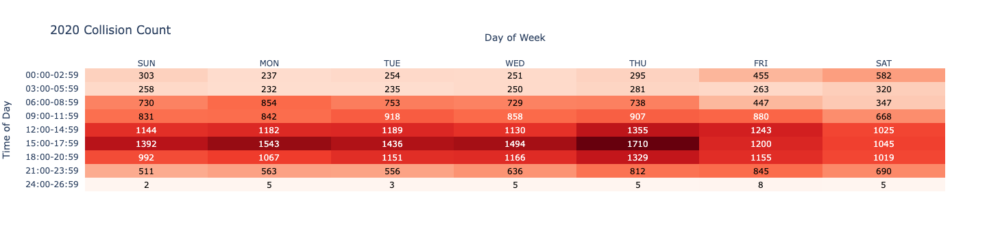

In [8]:
#function creating heatmap, defaults set

def collisioncount_heatmap(data = df_coll20, row = 'time_interval',col = 'DAY_OF_WEEK'):
    df_heatmap = data[[col,row,'CASE_ID']].groupby([col,row],as_index=False).count()
    rows = data[row].unique().tolist()
    rows.sort()
    rows.reverse()
    cols = data[col].unique().tolist()
    cols.sort()
    table_heatmap = pd.DataFrame(0,index = rows,columns=cols)
    
    for r in rows:
        for c in cols:
            try:
                table_heatmap.at[r,c] = df_heatmap.loc[(df_heatmap[col]==c) & (df_heatmap[row]==r),'CASE_ID']
            except:
                pass
    fig = ff.create_annotated_heatmap(table_heatmap.to_numpy() , x=cols,y=rows,colorscale='Reds')
    return fig
fig = collisioncount_heatmap()

fig.update_layout(title = "2020 Collision Count",xaxis = dict(tickmode='array',tickvals = list(days.keys()),ticktext=list(days.values())),xaxis_title="Day of Week", yaxis_title="Time of Day")
fig


According to the heatmap above, the most frequent time for collisions to occur was in the evening on days in the middle of the week. This likely has to do with fatigue experienced by drivers who commute long distances

/tmp/ipykernel_162/2742681010.py:15: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



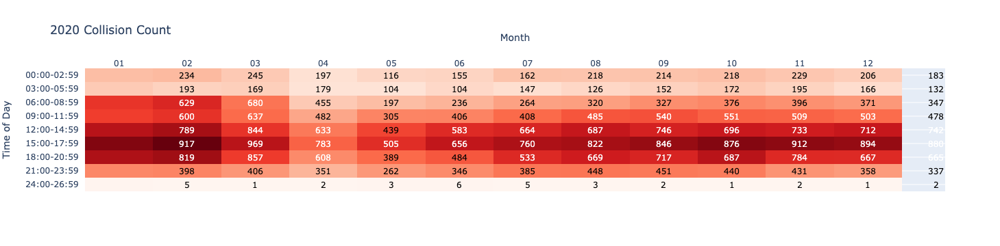

In [9]:
fig = collisioncount_heatmap(col='MONTH')

fig.update_layout(title = "2020 Collision Count",xaxis_title="Month", yaxis_title="Time of Day")
fig


Looking at a heatmap showing collision count by month and time of day, it's clear that crashes occur most frequently during the winter months in the evening. This can likely be attributed to poor visibility and weather conditions

/tmp/ipykernel_162/1667201461.py:13: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



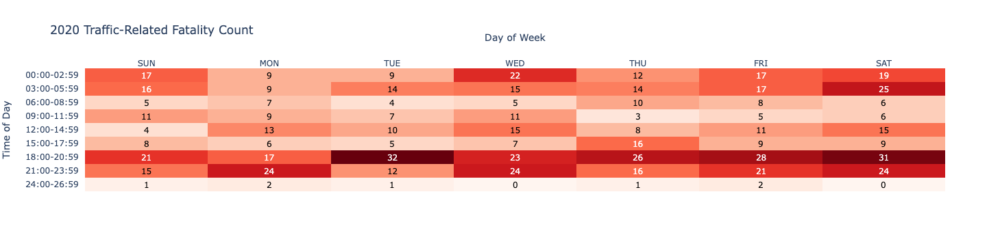

In [10]:
def collisionsum_heatmap(data = df_coll20, row = 'time_interval',col = 'DAY_OF_WEEK',sum = 'NUMBER_KILLED'):
    df_heatmap = data[[col,row,sum]].groupby([col,row],as_index=False).sum()
    rows = data[row].unique().tolist()
    rows.sort()
    rows.reverse()
    cols = data[col].unique().tolist()
    cols.sort()
    table_heatmap = pd.DataFrame(0,index = rows,columns=cols)
    
    for r in rows:
        for c in cols:
            try:
                table_heatmap.at[r,c] = df_heatmap.loc[(df_heatmap[col]==c) & (df_heatmap[row]==r),sum]
            except:
                pass
    fig = ff.create_annotated_heatmap(table_heatmap.to_numpy() , x=cols,y=rows,colorscale='Reds')
    return fig


fig = collisionsum_heatmap()

fig.update_layout(title = "2020 Traffic-Related Fatality Count",xaxis = dict(tickmode='array',tickvals = list(days.keys()),ticktext=list(days.values())),xaxis_title="Day of Week", yaxis_title="Time of Day")
fig




This looks at traffic fatalities separated by day of week and time of day. The distribution changes, as now collisions occur most frequently in the evening and late at night. This may have to do with not only fatigue but also reckless driving such as excessive speed or driving under the influence

/tmp/ipykernel_162/1667201461.py:13: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



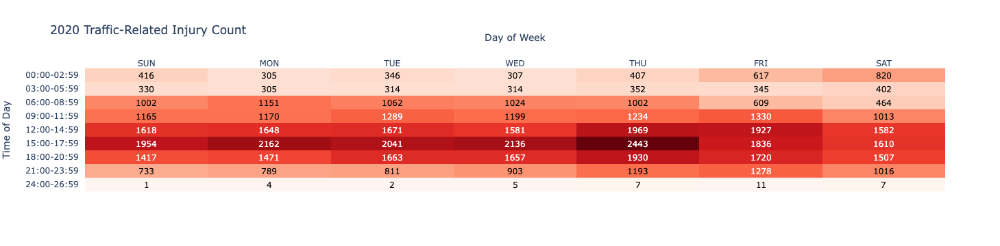

In [11]:
fig = collisionsum_heatmap(sum = 'NUMBER_INJURED')

fig.update_layout(title = "2020 Traffic-Related Injury Count",xaxis = dict(tickmode='array',tickvals = list(days.keys()),ticktext=list(days.values())),xaxis_title="Day of Week", yaxis_title="Time of Day")
fig


In looking at the overall cost of collisions, we go back to a heat map showing all collisions that result in some sort of injury. This is pretty similar to the first heatmap of all collisions, which makes it clear that there is a degree of commonality among these accidents that causes them to occur more frequently during weekday evenings.

Now let's turn to mapping some of these components

In [12]:
#convert to geodataframe

gdf_coll20 = gpd.GeoDataFrame(df_coll20, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(df_coll20.POINT_X, df_coll20.POINT_Y))
gdf_coll20.head()

,CASE_ID,ACCIDENT_YEAR,PROC_DATE,JURIS,COLLISION_DATE,COLLISION_TIME,OFFICER_ID,REPORTING_DISTRICT,DAY_OF_WEEK,CHP_SHIFT,...,LATITUDE,LONGITUDE,COUNTY,CITY,POINT_X,POINT_Y,time_interval,DAY_OF_WEEK_FULL,MONTH,geometry
0,8008484,2020,2020-11-20,1942,2020-08-06,21:25,18124,1494,4,5,...,NaN,NaN,"""LOS ANGELES""","""LOS ANGELES""",-118.415863,33.931461,21:00-23:59,WED,08,POINT (-118.41586 33.93146)
1,8008488,2020,2020-10-23,1942,2020-08-06,19:20,41957,1434,4,5,...,NaN,NaN,"""LOS ANGELES""","""LOS ANGELES""",-118.433716,34.003693,18:00-20:59,WED,08,POINT (-118.43372 34.00369)
2,8008496,2020,2020-10-24,1942,2020-08-13,17:45,32820,1405,4,5,...,NaN,NaN,"""LOS ANGELES""","""LOS ANGELES""",-118.414673,34.030849,15:00-17:59,WED,08,POINT (-118.41467 34.03085)
3,8008508,2020,2020-12-04,1942,2020-09-02,12:20,34209,NaN,3,5,...,NaN,NaN,"""LOS ANGELES""","""LOS ANGELES""",-118.463524,33.981049,12:00-14:59,TUE,09,POINT (-118.46352 33.98105)
4,8008516,2020,2020-12-01,1942,2020-09-11,11:15,33869,0806,5,5,...,NaN,NaN,"""LOS ANGELES""","""LOS ANGELES""",-118.441116,34.085972,09:00-11:59,THU,09,POINT (-118.44112 34.08597)


In [13]:
#create interactive map
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

fg2 = folium.FeatureGroup(name='Pedestrian Accidents (Fatal)', show=False).add_to(m)
fg1 = folium.FeatureGroup(name='Pedestrian Accidents', show=True).add_to(m)

gdf_ped = gdf_coll20[~(gdf_coll20.geometry.is_empty) & (gdf_coll20['PEDESTRIAN_ACCIDENT']=='Y')]
gdf_ped_fat = gdf_coll20[~(gdf_coll20.geometry.is_empty) & (gdf_coll20['PEDESTRIAN_ACCIDENT']=='Y') & (gdf_coll20['COUNT_PED_KILLED']>0)]



gdf_ped_list = [(lat, lon) for lat, lon in zip(gdf_ped.POINT_Y,gdf_ped.POINT_X)]
gdf_ped_fat_list = [(lat, lon) for lat, lon in zip(gdf_ped_fat.POINT_Y,gdf_ped_fat.POINT_X)]

HeatMap(gdf_ped_list).add_to(fg1)

for coord in gdf_ped_fat_list:
 folium.Marker(location=coord,icon = folium.Icon(color="red",icon="skull", prefix='fa')).add_to(fg2)
folium.LayerControl().add_to(m)


m

In [14]:
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')
fg3 = folium.FeatureGroup(name='Bicycle Accidents Total',show=True).add_to(m)
fg2 = folium.FeatureGroup(name='Bicycle Accidents (Fatal)', show=False).add_to(m)
fg1 = folium.FeatureGroup(name='Bicycle Accidents (Severely Injured, Nonfatal)', show=False).add_to(m)

gdf_bike = gdf_coll20[~(gdf_coll20.geometry.is_empty) & (gdf_coll20['BICYCLE_ACCIDENT']=='Y')]
gdf_bike_fat = gdf_coll20[~(gdf_coll20.geometry.is_empty) & (gdf_coll20['BICYCLE_ACCIDENT']=='Y') & (gdf_coll20['COUNT_BICYCLIST_KILLED']>0)]
gdf_bike_inj = gdf_coll20[~(gdf_coll20.geometry.is_empty) & (gdf_coll20['BICYCLE_ACCIDENT']=='Y') & (gdf_coll20['COUNT_BICYCLIST_KILLED']==0) & (gdf_coll20['COUNT_SEVERE_INJ']>0)]



gdf_bike_list = [(lat, lon) for lat, lon in zip(gdf_bike.POINT_Y,gdf_bike.POINT_X)]
gdf_bike_fat_list = [(lat, lon) for lat, lon in zip(gdf_bike_fat.POINT_Y,gdf_bike_fat.POINT_X)]
gdf_bike_inj_list = [(lat, lon) for lat, lon in zip(gdf_bike_inj.POINT_Y,gdf_bike_inj.POINT_X)]


HeatMap(gdf_bike_list).add_to(fg3)

# Add points to the map instance
for coord in gdf_bike_fat_list:
 folium.Marker(location=coord,icon = folium.Icon(color="red",icon="skull", prefix='fa')).add_to(fg2)

for coord in gdf_bike_inj_list:
 folium.Marker(location=coord,icon = folium.Icon(color="orange",icon="user-injured", prefix='fa')).add_to(fg1)

folium.LayerControl().add_to(m)
#Show map
m

In [15]:
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')
fg2 = folium.FeatureGroup(name='Bicycle Accidents (Fatal)',show=True).add_to(m)
fg1 = folium.FeatureGroup(name='Pedestrian Accidents (Fatal)', show=False).add_to(m)

icon_create_function_bike = """\
function(cluster) {
    return L.divIcon({
    html: '<b><center>' + cluster.getChildCount() + '</center></b>',
    className: 'marker-cluster marker-cluster-medium',
    iconSize: new L.Point(50, 50),
    iconAnchor: [25, 50], // Adjust the icon anchor if necessary
    html: '<div style="background-color: yellow; width: 40px; height: 40px; border-radius: 50%; text-align: center; line-height: 40px;"><b>' + cluster.getChildCount() + '</b></div>'
    });
}"""

icon_create_function_ped = """\
function(cluster) {
    return L.divIcon({
    html: '<b><center>' + cluster.getChildCount() + '</center></b>',
    className: 'marker-cluster marker-cluster-large',
    iconSize: new L.Point(50, 50),
    iconAnchor: [25, 50], // Adjust the icon anchor if necessary
    html: '<div style="background-color: pink; width: 40px; height: 40px; border-radius: 50%; text-align: center; line-height: 40px;"><b>' + cluster.getChildCount() + '</b></div>'
    });
}"""

# Add points to the map instance
marker_cluster_1 = MarkerCluster(
    overlay=True,
    control=True,
    icon_create_function=icon_create_function_ped,
).add_to(fg1)

marker_cluster_2 = MarkerCluster(
    overlay=True,
    control=True,
    icon_create_function=icon_create_function_bike,
).add_to(fg2)

for coord in gdf_ped_fat_list:
 folium.Marker(location=coord,icon = folium.Icon(color="lightred",icon="person-walking", prefix='fa')).add_to(marker_cluster_1)


for coord in gdf_bike_fat_list:
 folium.Marker(location=coord,icon = folium.Icon(color="orange",icon="bicycle", prefix='fa')).add_to(marker_cluster_2)

folium.LayerControl().add_to(m)

m



In [16]:
gdf_coll20['TYPE_OF_COLLISION'].unique()

array(['B', 'C', 'A', 'G', 'E', 'H', 'D', 'F', '-', 'N', '" "'],
      dtype=object)

In [17]:
gdf_coll20['Parties Involved']= 'CAR'
parties = ['PEDESTRIAN_ACCIDENT','BICYCLE_ACCIDENT', 'MOTORCYCLE_ACCIDENT', 'TRUCK_ACCIDENT']
for party in parties:
    gdf_coll20.loc[gdf_coll20[party] == 'Y','Parties Involved']= party.split('_')[0]
gdf_coll20['Parties Involved'].unique()

array(['TRUCK', 'CAR', 'PEDESTRIAN', 'MOTORCYCLE', 'BICYCLE'],
      dtype=object)

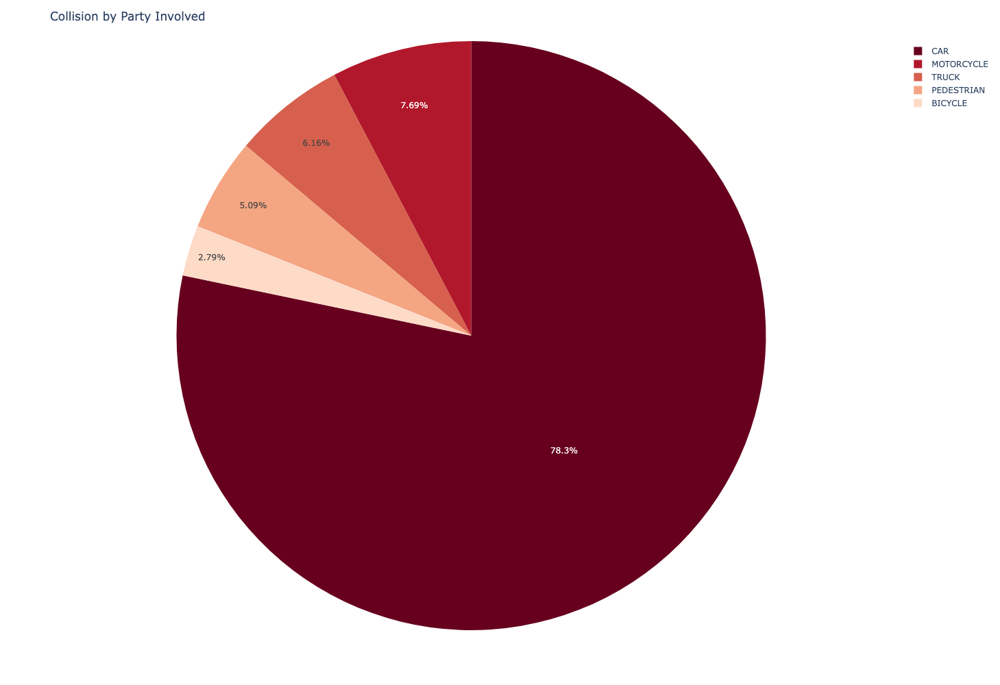

In [18]:
fig = px.pie(gdf_coll20, values='CASE_ID', names='Parties Involved',color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(height=1000,title = 'Collision by Party Involved',width=1000)
fig.show()

In [19]:
gdf_coll20['Injury Level']= 'NONE'
injurytype = ['COUNT_SEVERE_INJ', 'COUNT_VISIBLE_INJ','NUMBER_KILLED']
for injury in injurytype:
    gdf_coll20.loc[gdf_coll20[injury] > 0,'Injury Level']= injury[injury.find("_")+1:]
injurylevels = gdf_coll20['Injury Level'].unique().tolist()

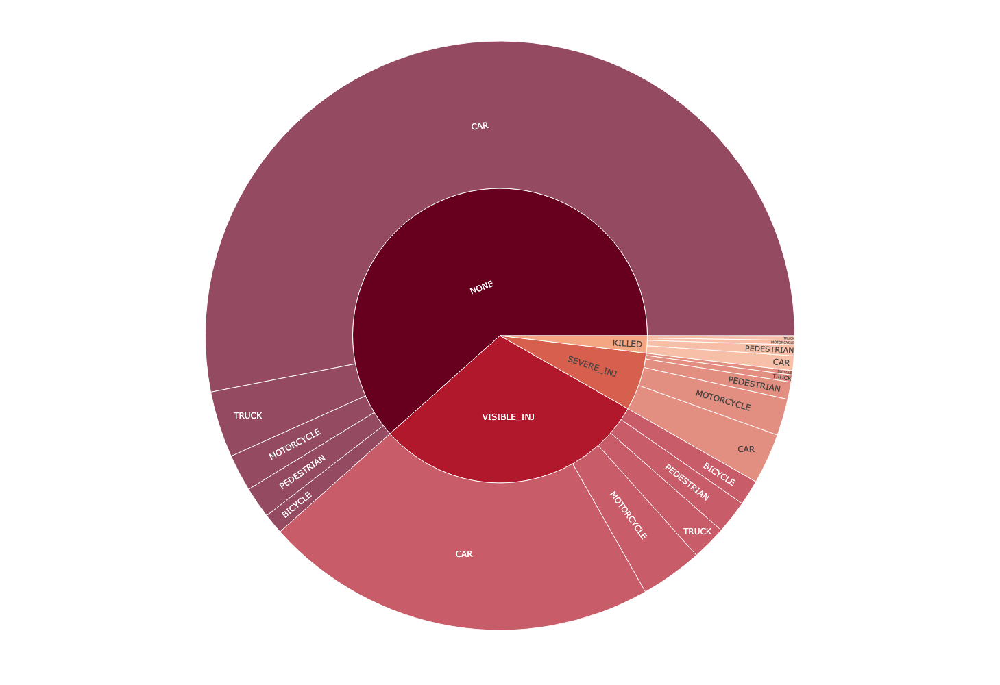

In [20]:

fig = px.sunburst(gdf_coll20[(gdf_coll20['NUMBER_KILLED']>0) | (gdf_coll20['NUMBER_INJURED']>0)], path=['Injury Level','Parties Involved'], values='CASE_ID',color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(height=1000,width=1000)
fig.show()

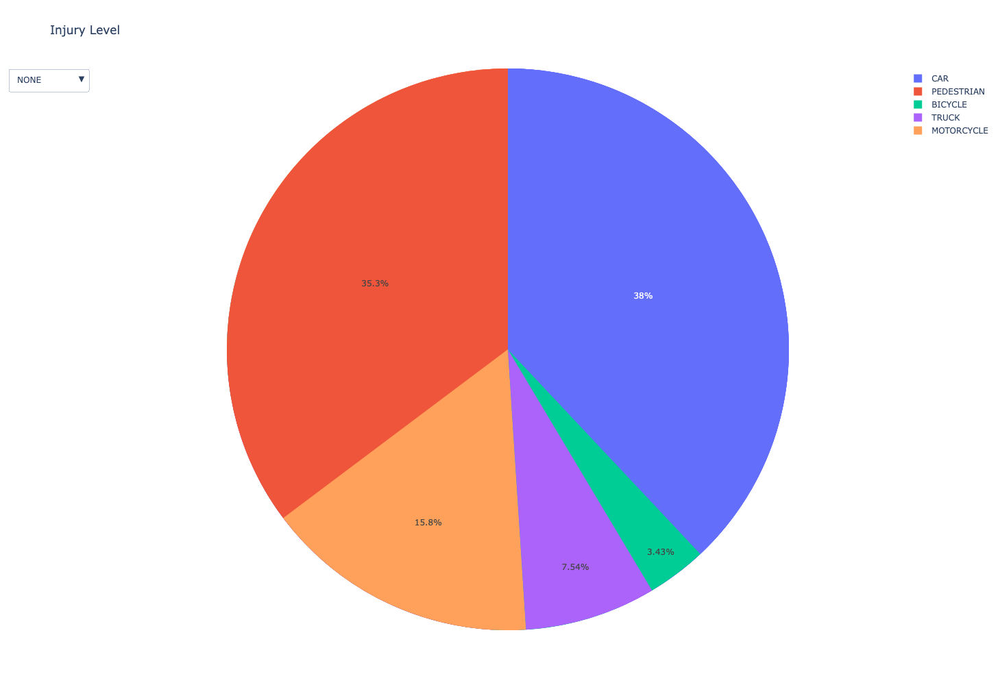

In [21]:
fig = go.Figure()

gdf_coll20summary = gdf_coll20[["Injury Level","CASE_ID","Parties Involved"]].groupby(by=["Injury Level","Parties Involved"],as_index=False)["CASE_ID"].count()
for injury in injurylevels:
    gdf_inj = gdf_coll20summary[gdf_coll20summary["Injury Level"]==injury]
    fig.add_trace(go.Pie(
                         labels = gdf_inj['Parties Involved'].values.tolist(),
                         values=gdf_inj['CASE_ID'].values.tolist()))


fig.update_layout(title_text='2020 Collision Data by Injury Level')

buttonlist = []

for i,injury in enumerate(injurylevels):
    buttonlist.append(dict(label=injury,
                 method="update",
                 args=[{"visible":[False]*(i) + [True] + [False]*(3-i)},
                       {"title":injury}]))


fig.update_layout(
    height = 1000,
    title = 'Injury Level',
    width = 1000
)
    
    

fig.update_layout(
    updatemenus=[
        dict(active=0,
            buttons=buttonlist,
        )
    ]
)

fig.show()

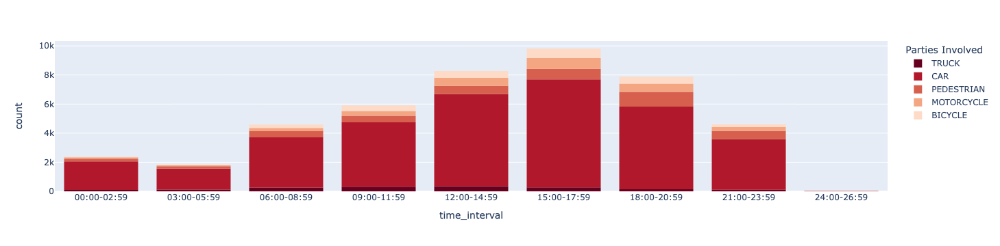

In [22]:
fig = px.histogram(gdf_coll20, x="time_interval", color="Parties Involved",color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_xaxes(categoryorder='array', categoryarray= time_intervals)
fig.show()

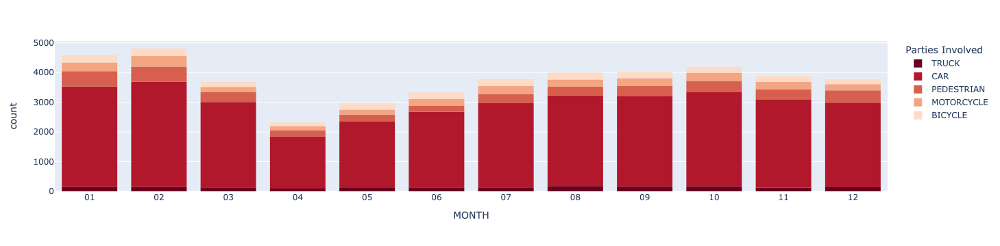

In [23]:
fig = px.histogram(gdf_coll20, x="MONTH", color="Parties Involved",color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_xaxes(categoryorder='array', categoryarray= months)
fig.show()

### Fitting this in with the overall demographics of LA County roadway users

Let's look in particular as commute patterns

In [24]:
df_commute = pd.read_csv('Data/Commuter_Data_Census_2018-22.csv',dtype={'Geo_FIPS':str,'Geo_STATE':str,'Geo_COUNTY':str,'Geo_TRACT':str})
df_commute.head()

,Geo_FIPS,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_US,Geo_REGION,Geo_DIVISION,Geo_STATE,Geo_COUNTY,...,SE_A09005_007,SE_A09005_008,SE_A09002_001,SE_A09002_002,SE_A09002_003,SE_A09002_004,SE_A09002_005,SE_A09002_006,SE_A09002_007,SE_A09002_008
0,06037101110,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,2,106,1937,11,302,704,526,175,167,52
1,06037101122,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,78,336,1678,0,150,532,467,249,210,70
2,06037101220,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,111,115,1550,34,305,343,608,134,118,8
3,06037101221,"Census Tract 1012.21, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,131,23,1739,27,51,693,501,167,232,68
4,06037101222,"Census Tract 1012.22, Los Angeles County, Cali...",ca,140,0,NaN,NaN,NaN,06,037,...,12,26,1079,68,416,255,140,31,157,12


In [25]:
df_commute.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2498 entries, 0 to 2497
Data columns (total 63 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Geo_FIPS       2498 non-null   object 
 1   Geo_QName      2498 non-null   object 
 2   Geo_STUSAB     2498 non-null   object 
 3   Geo_SUMLEV     2498 non-null   int64  
 4   Geo_GEOCOMP    2498 non-null   int64  
 5   Geo_US         0 non-null      float64
 6   Geo_REGION     0 non-null      float64
 7   Geo_DIVISION   0 non-null      float64
 8   Geo_STATE      2498 non-null   object 
 9   Geo_COUNTY     2498 non-null   object 
 10  Geo_COUSUB     0 non-null      float64
 11  Geo_PLACE      0 non-null      float64
 12  Geo_TRACT      2498 non-null   object 
 13  Geo_BLKGRP     0 non-null      float64
 14  Geo_CONCIT     0 non-null      float64
 15  Geo_AIANHH     0 non-null      float64
 16  Geo_AIANHHFP   0 non-null      float64
 17  Geo_AIHHTLI    0 non-null      float64
 18  Geo_AITS

In [26]:
#mapping using table of names from social data explorer
column_dict={
    'SE_A09005_001':'Workers 16 Years and Over:',
    'SE_A09005_002':'Car, Truck, or Van',
    'SE_A09005_009':'Drove Alone',
    'SE_A09005_010':'Carpooled',
    'SE_A09005_003':'Public Transportation (Includes Taxicab)',
    'SE_A09005_004':'Motorcycle',
    'SE_A09005_005':'Bicycle',
    'SE_A09005_006':'Walked',
    'SE_A09005_007':'Other Means',
    'SE_A09005_008':'Worked At Home',
    'SE_A09002_001':'Workers 16 Years and Over Who Did Not Work From Home:',
    'SE_A09002_002':'Less than 5 Minutes',
    'SE_A09002_003':'5 to 14 Minutes',
    'SE_A09002_004':'15 to 29 Minutes',
    'SE_A09002_005':'30 to 44 Minutes',
    'SE_A09002_006':'45 to 59 Minutes',
    'SE_A09002_007':'60 to 89 Minutes',
    'SE_A09002_008':'90 or More Minutes'}

In [27]:
tracts = gpd.read_file('Data/Census_Tracts_2020.geojson')
tracts.info(verbose=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2495 entries, 0 to 2494
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   OBJECTID       2495 non-null   int64   
 1   CT20           2495 non-null   object  
 2   LABEL          2495 non-null   object  
 3   ShapeSTArea    2495 non-null   float64 
 4   ShapeSTLength  2495 non-null   float64 
 5   geometry       2495 non-null   geometry
dtypes: float64(2), geometry(1), int64(1), object(2)
memory usage: 117.1+ KB


In [28]:
tracts.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2..."
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2..."


In [29]:
tracts_commute = tracts.merge(df_commute,how='left',left_on = 'CT20',right_on = 'Geo_TRACT')
tracts_commute

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry,Geo_FIPS,Geo_QName,Geo_STUSAB,Geo_SUMLEV,...,SE_A09005_007,SE_A09005_008,SE_A09002_001,SE_A09002_002,SE_A09002_003,SE_A09002_004,SE_A09002_005,SE_A09002_006,SE_A09002_007,SE_A09002_008
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,...,2,106,1937,11,302,704,526,175,167,52
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,...,78,336,1678,0,150,532,467,249,210,70
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,...,111,115,1550,34,305,343,608,134,118,8
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221,"Census Tract 1012.21, Los Angeles County, Cali...",ca,140,...,131,23,1739,27,51,693,501,167,232,68
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2...",06037101222,"Census Tract 1012.22, Los Angeles County, Cali...",ca,140,...,12,26,1079,68,416,255,140,31,157,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2490,2491,980035,9800.35,1.716394e+08,107459.157092,"POLYGON ((-117.98268 34.04469, -117.98287 34.0...",06037980035,"Census Tract 9800.35, Los Angeles County, Cali...",ca,140,...,0,28,271,5,49,95,54,5,31,32
2491,2492,980036,9800.36,9.425460e+07,67746.068379,"POLYGON ((-118.07027 34.05725, -118.07073 34.0...",06037980036,"Census Tract 9800.36, Los Angeles County, Cali...",ca,140,...,0,55,245,0,33,56,100,5,51,0
2492,2493,980037,9800.37,1.402219e+07,15116.000420,"POLYGON ((-118.28411 33.80773, -118.28447 33.8...",06037980037,"Census Tract 9800.37, Los Angeles County, Cali...",ca,140,...,0,0,0,0,0,0,0,0,0,0
2493,2494,980038,9800.38,4.861673e+07,42991.767229,"POLYGON ((-118.36674 34.01539, -118.36673 34.0...",06037980038,"Census Tract 9800.38, Los Angeles County, Cali...",ca,140,...,0,0,0,0,0,0,0,0,0,0


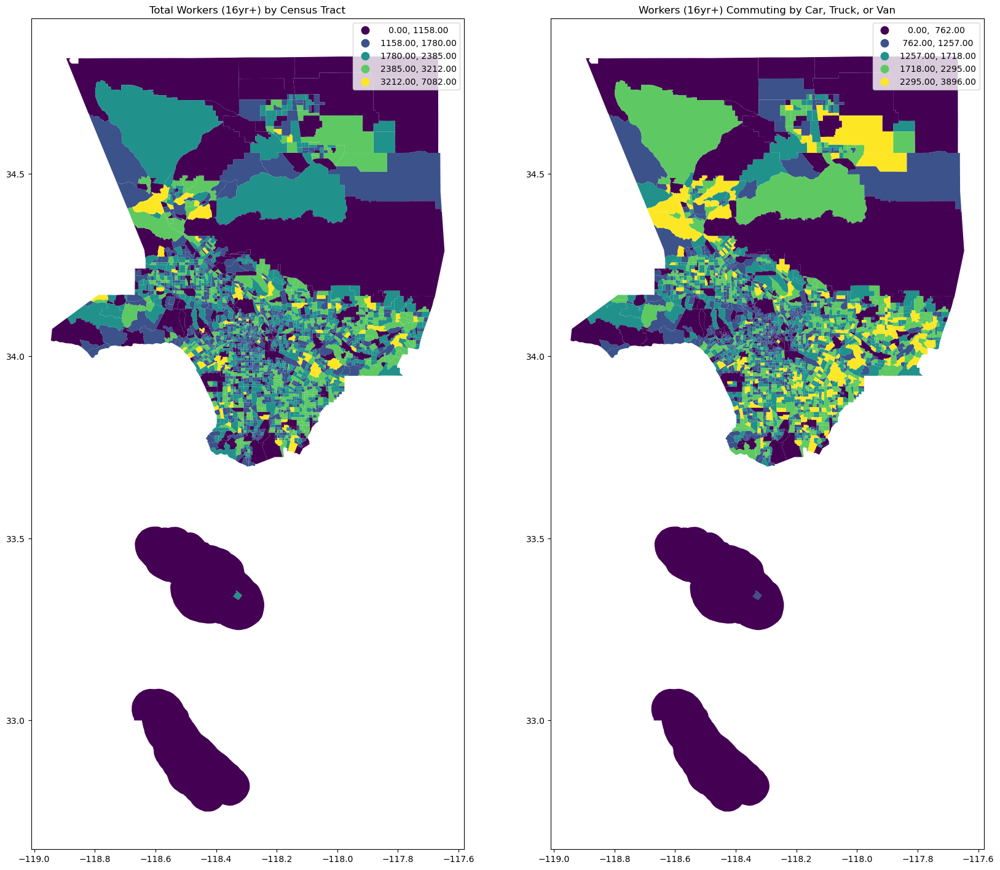

In [30]:
fig,ax = plt.subplots(1,2,figsize=(20,30))
tracts_commute.plot(figsize=(12,10),
                 column='SE_A09005_001',
                 ax=ax[0],
                 legend=True, 
                 scheme='NaturalBreaks')
ax[0].title.set_text('Total Workers (16yr+) by Census Tract')
tracts_commute.plot(figsize=(12,10),
                 column='SE_A09005_002',
                 ax=ax[1],
                 legend=True, 
                 scheme='NaturalBreaks')
ax[1].title.set_text('Workers (16yr+) Commuting by Car, Truck, or Van')



We see that LA County residents living near the periphery of the county boundaries and away from the downtown center are overrepresented in the population of those using cars, trucks or vans to commute compared to total working population 16 years and older

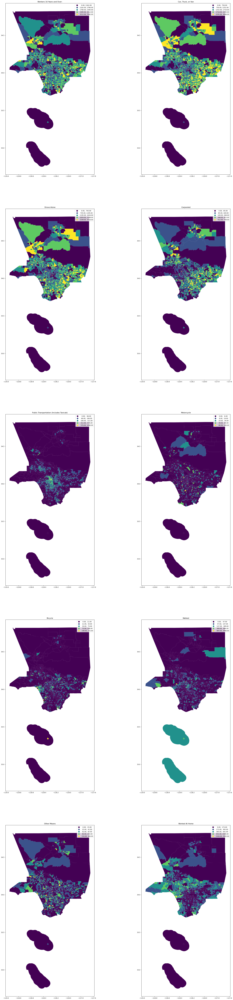

In [31]:
travel_means={'SE_A09005_001':'Workers 16 Years and Over:',
    'SE_A09005_002':'Car, Truck, or Van',
    'SE_A09005_009':'Drove Alone',
    'SE_A09005_010':'Carpooled',
    'SE_A09005_003':'Public Transportation (Includes Taxicab)',
    'SE_A09005_004':'Motorcycle',
    'SE_A09005_005':'Bicycle',
    'SE_A09005_006':'Walked',
    'SE_A09005_007':'Other Means',
    'SE_A09005_008':'Worked At Home'}

fig,ax = plt.subplots(5,2,figsize=(30,120))

for ax,col in zip(ax.flatten(),list(travel_means.keys())):
    tracts_commute.plot(
                     column=col,
                     ax=ax,
                     legend=True, 
                     scheme='NaturalBreaks')
    ax.title.set_text(travel_means.get(col))


In [32]:

# tracts_commute['% of Workers who Commute by Motor Vehicle'] = tracts_commute['SE_A09005_002']/tracts_commute['SE_A09005_001']
# tracts_commute['% of Workers who Commute by Public Transportation'] = tracts_commute['SE_A09005_003']/tracts_commute['SE_A09005_001']


# m = folium.Map(location=[34.2,-118.2], 
#                zoom_start = 9,
#                tiles='CartoDB positron', 
#                attribution='CartoDB')


# folium.Choropleth(
#                   geo_data=tracts_commute,
#                   data=tracts_commute, # data          
#                   key_on='feature.properties.Geo_FIPS', 
#                   columns=['Geo_FIPS', '% of Workers who Commute by Motor Vehicle'],
#                   fill_color='BuPu',
#                   line_weight=0.1, 
#                   fill_opacity=0.8,
#                   line_opacity=0.2, # line opacity (of the border)
#                   legend_name='% of Workers who Commute by Motor Vehicle').add_to(m) 
# folium.Choropleth(
#                   geo_data=tracts_commute,
#                   data=tracts_commute, # data          
#                   key_on='feature.properties.Geo_FIPS', 
#                   columns=['Geo_FIPS', '% of Workers who Commute by Public Transportation'],
#                   fill_color='OrRd',
#                   line_weight=0.1, 
#                   fill_opacity=0.8,
#                   line_opacity=0.2, # line opacity (of the border)
#                   legend_name='% of Workers who Commute by Public Transportation').add_to(m) 
# folium.LayerControl().add_to(m)

# m


In [ ]:

# tracts_commute['% of Workers who Commute by Motor Vehicle'] = tracts_commute['SE_A09005_002']/tracts_commute['SE_A09005_001']
# tracts_commute['% of Workers who Commute by Public Transportation'] = tracts_commute['SE_A09005_003']/tracts_commute['SE_A09005_001']


# m = folium.Map(location=[34.2,-118.2], 
#                zoom_start = 9,
#                tiles='CartoDB positron', 
#                attribution='CartoDB')


# folium.Choropleth(
#                   geo_data=tracts_commute,
#                   data=tracts_commute, # data          
#                   key_on='feature.properties.Geo_FIPS', 
#                   columns=['Geo_FIPS', '% of Workers who Commute by Motor Vehicle'],
#                   fill_color='BuPu',
#                   line_weight=0.1, 
#                   fill_opacity=0.8,
#                   line_opacity=0.2, # line opacity (of the border)
#                   legend_name='% of Workers who Commute by Motor Vehicle').add_to(m) 
# folium.Choropleth(
#                   geo_data=tracts_commute,
#                   data=tracts_commute, # data          
#                   key_on='feature.properties.Geo_FIPS', 
#                   columns=['Geo_FIPS', 'SE_A09005_002'],
#                   fill_color='OrRd',
#                   line_weight=0.1, 
#                   fill_opacity=0.8,
#                   line_opacity=0.2, # line opacity (of the border)
#                   legend_name='# of Workers who Commute by Motor Vehicle').add_to(m) 
# folium.LayerControl().add_to(m)

# m


In [ ]:
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

fg1 = folium.FeatureGroup(name='Accidents (Vehicle Only)',show=True).add_to(m)
fg2 = folium.FeatureGroup(name='Fatal Accidents (Vehicle Only)', show=False).add_to(m)

icon_create_function_nonfat = """\
function(cluster) {
    return L.divIcon({
    html: '<b><center>' + cluster.getChildCount() + '</center></b>',
    className: 'marker-cluster marker-cluster-medium',
    iconSize: new L.Point(50, 50),
    iconAnchor: [25, 50], // Adjust the icon anchor if necessary
    html: '<div style="background-color: yellow; width: 40px; height: 40px; border-radius: 50%; text-align: center; line-height: 40px;"><b>' + cluster.getChildCount() + '</b></div>'
    });
}"""

icon_create_function_fat = """\
function(cluster) {
    return L.divIcon({
    html: '<b><center>' + cluster.getChildCount() + '</center></b>',
    className: 'marker-cluster marker-cluster-large',
    iconSize: new L.Point(50, 50),
    iconAnchor: [25, 50], // Adjust the icon anchor if necessary
    html: '<div style="background-color: pink; width: 40px; height: 40px; border-radius: 50%; text-align: center; line-height: 40px;"><b>' + cluster.getChildCount() + '</b></div>'
    });
}"""

# Add points to the map instance
marker_cluster_1 = MarkerCluster(
    overlay=True,
    control=True,
    icon_create_function=icon_create_function_ped,
).add_to(fg1)

marker_cluster_2 = MarkerCluster(
    overlay=True,
    control=True,
    icon_create_function=icon_create_function_bike,
).add_to(fg2)

gdf_veh = gdf_coll20[~(gdf_coll20.geometry.is_empty) & ((gdf_coll20['Parties Involved']=='CAR')|(gdf_coll20['Parties Involved']=='TRUCK'))]
gdf_veh_fat = gdf_coll20[~(gdf_coll20.geometry.is_empty) & ((gdf_coll20['Parties Involved']=='CAR')|(gdf_coll20['Parties Involved']=='TRUCK')) & (gdf_coll20['NUMBER_KILLED']>0)]



gdf_veh_list = [(lat, lon) for lat, lon in zip(gdf_veh.POINT_Y,gdf_veh.POINT_X)]
gdf_veh_fat_list = [(lat, lon) for lat, lon in zip(gdf_veh_fat.POINT_Y,gdf_veh_fat.POINT_X)]


for coord in gdf_veh_list:
 folium.Marker(location=coord,icon = folium.Icon(color="orange",icon="car", prefix='fa')).add_to(marker_cluster_1)


for coord in gdf_veh_fat_list:
 folium.Marker(location=coord,icon = folium.Icon(color="red",icon="skull", prefix='fa')).add_to(marker_cluster_2)

folium.Choropleth(
                  geo_data=tracts_commute,
                  data=tracts_commute, # data          
                  key_on='feature.properties.Geo_FIPS', 
                  columns=['Geo_FIPS', 'SE_A09005_002'],
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='# of Workers who Commute by Vehicle').add_to(m) 
folium.LayerControl().add_to(m)

m
